<a href="https://colab.research.google.com/github/singhjyoti1997/Deep-Learning/blob/main/cityscapes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/dinararzayeva/city-dataset'
od.download(dataset_url)

Skipping, found downloaded files in "./city-dataset" (use force=True to force download)


In [ ]:
import os

DATA_DIR = '/content/cityscapes'
print(os.listdir(DATA_DIR))

['img']


In [ ]:
print(os.listdir(DATA_DIR+'/img')[:10])

['2011_photo.jpg', '1115_photo.jpg', '231_photo.jpg', '2006_photo.jpg', '2082_photo.jpg', '294_photo.jpg', '133_photo.jpg', '2069_photo.jpg', '2126_photo.jpg', '1084_photo.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


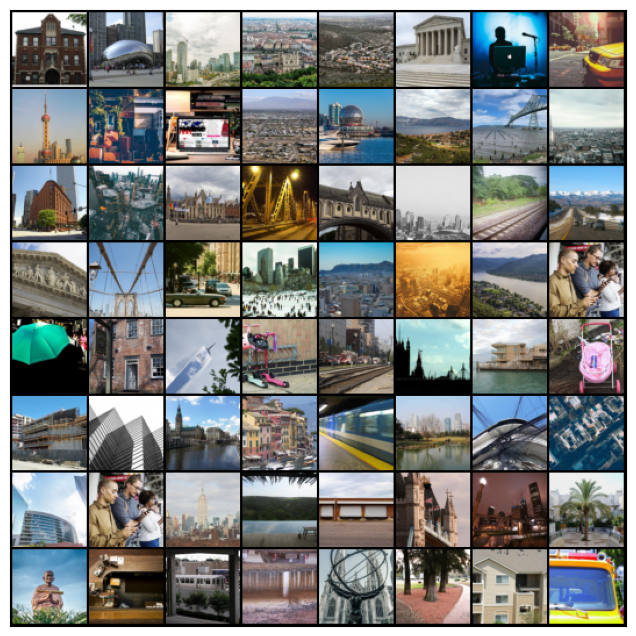

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


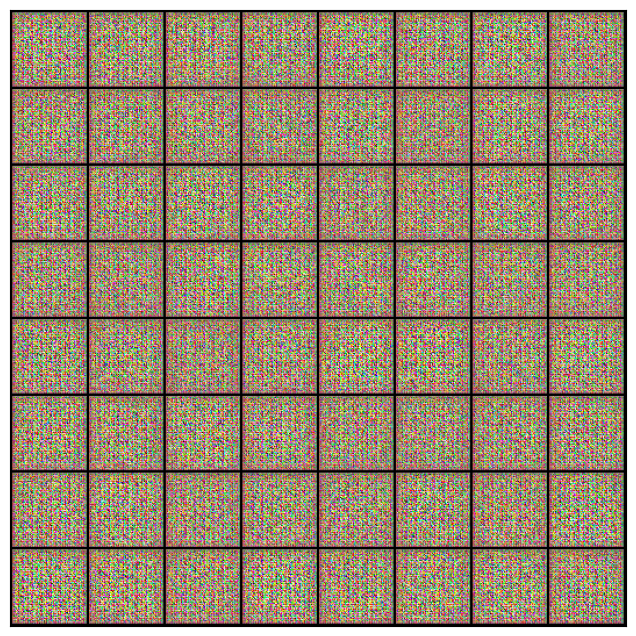

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


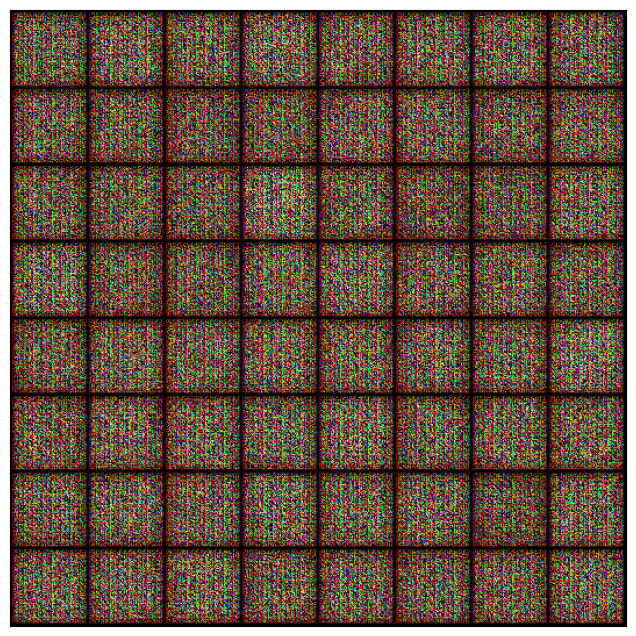

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 30

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [1/30], loss_g: 9.5119, loss_d: 0.7258, real_score: 0.8298, fake_score: 0.3879
Saving generated-images-0001.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [2/30], loss_g: 11.6400, loss_d: 0.1943, real_score: 0.8336, fake_score: 0.0000
Saving generated-images-0002.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [3/30], loss_g: 7.6757, loss_d: 0.5432, real_score: 0.6597, fake_score: 0.0006
Saving generated-images-0003.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [4/30], loss_g: 7.2361, loss_d: 1.7285, real_score: 0.9640, fake_score: 0.7595
Saving generated-images-0004.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [5/30], loss_g: 2.6024, loss_d: 0.4380, real_score: 0.8151, fake_score: 0.1975
Saving generated-images-0005.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [6/30], loss_g: 4.3339, loss_d: 0.2437, real_score: 0.9383, fake_score: 0.1572
Saving generated-images-0006.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [7/30], loss_g: 3.8990, loss_d: 0.1804, real_score: 0.9019, fake_score: 0.0708
Saving generated-images-0007.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [8/30], loss_g: 3.9950, loss_d: 0.1854, real_score: 0.9336, fake_score: 0.1081
Saving generated-images-0008.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [9/30], loss_g: 0.7581, loss_d: 0.8853, real_score: 0.4963, fake_score: 0.0890
Saving generated-images-0009.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [10/30], loss_g: 1.7447, loss_d: 1.4136, real_score: 0.7149, fake_score: 0.5935
Saving generated-images-0010.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [11/30], loss_g: 0.6709, loss_d: 1.0960, real_score: 0.4142, fake_score: 0.1048
Saving generated-images-0011.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [12/30], loss_g: 0.2812, loss_d: 1.1522, real_score: 0.3897, fake_score: 0.1183
Saving generated-images-0012.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [13/30], loss_g: 1.9040, loss_d: 1.6357, real_score: 0.3627, fake_score: 0.0025
Saving generated-images-0013.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [14/30], loss_g: 3.1312, loss_d: 0.5107, real_score: 0.7533, fake_score: 0.1862
Saving generated-images-0014.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [15/30], loss_g: 5.6793, loss_d: 1.0527, real_score: 0.9299, fake_score: 0.5648
Saving generated-images-0015.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [16/30], loss_g: 5.9751, loss_d: 1.6636, real_score: 0.9880, fake_score: 0.7663
Saving generated-images-0016.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [17/30], loss_g: 2.0762, loss_d: 0.8639, real_score: 0.6184, fake_score: 0.2505
Saving generated-images-0017.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [18/30], loss_g: 2.4643, loss_d: 0.5592, real_score: 0.6618, fake_score: 0.1173
Saving generated-images-0018.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [19/30], loss_g: 1.2886, loss_d: 1.2581, real_score: 0.4609, fake_score: 0.3395
Saving generated-images-0019.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [20/30], loss_g: 4.2609, loss_d: 0.5127, real_score: 0.9122, fake_score: 0.3315
Saving generated-images-0020.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [21/30], loss_g: 1.3632, loss_d: 0.6486, real_score: 0.7008, fake_score: 0.2344
Saving generated-images-0021.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [22/30], loss_g: 2.1447, loss_d: 0.5890, real_score: 0.8198, fake_score: 0.2800
Saving generated-images-0022.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [23/30], loss_g: 1.6824, loss_d: 0.8251, real_score: 0.5669, fake_score: 0.1908
Saving generated-images-0023.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [24/30], loss_g: 3.1937, loss_d: 0.4010, real_score: 0.8246, fake_score: 0.1318
Saving generated-images-0024.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [25/30], loss_g: 4.2934, loss_d: 0.6303, real_score: 0.8600, fake_score: 0.3502
Saving generated-images-0025.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [26/30], loss_g: 2.9330, loss_d: 0.6912, real_score: 0.7527, fake_score: 0.3074
Saving generated-images-0026.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [27/30], loss_g: 0.2263, loss_d: 1.3590, real_score: 0.2887, fake_score: 0.0771
Saving generated-images-0027.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [28/30], loss_g: 2.8004, loss_d: 0.4714, real_score: 0.6901, fake_score: 0.0774
Saving generated-images-0028.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [29/30], loss_g: 4.5075, loss_d: 0.5960, real_score: 0.8632, fake_score: 0.3435
Saving generated-images-0029.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [30/30], loss_g: 1.9328, loss_d: 0.6159, real_score: 0.6210, fake_score: 0.1033
Saving generated-images-0030.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

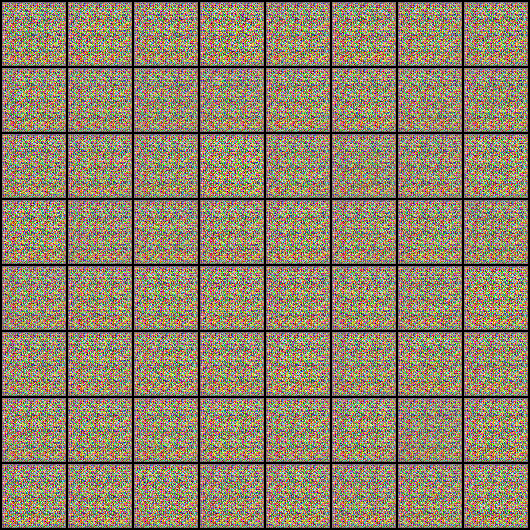

In [ ]:
Image('./generated/generated-images-0001.png')

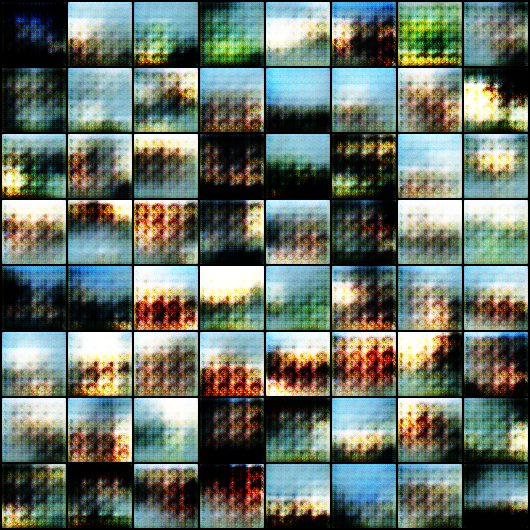

In [ ]:
Image('./generated/generated-images-0030.png')

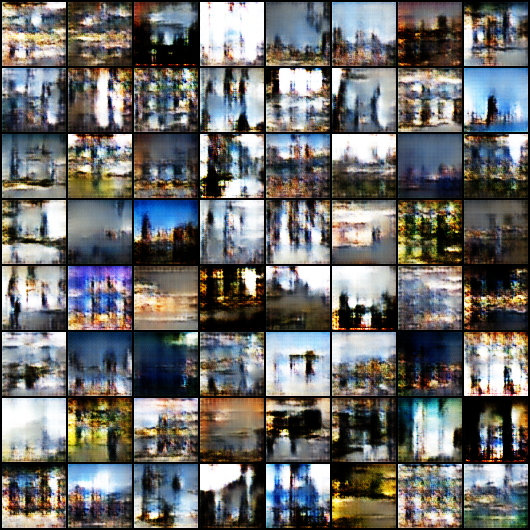

In [ ]:
Image('./generated/generated-images-0200.png')

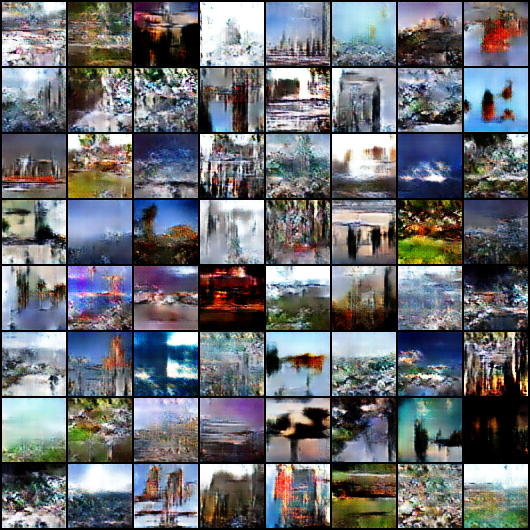

In [ ]:
Image('./generated/generated-images-0300.png')

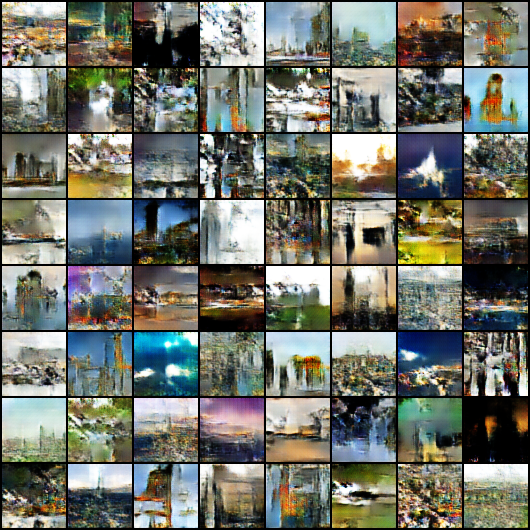

In [ ]:
Image('./generated/generated-images-0400.png')

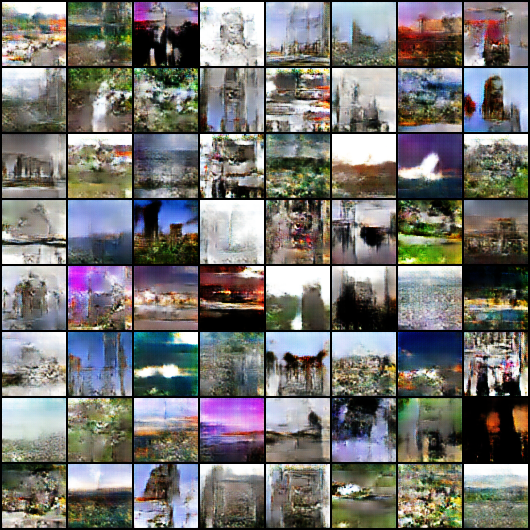

In [ ]:
Image('./generated/generated-images-0450.png')

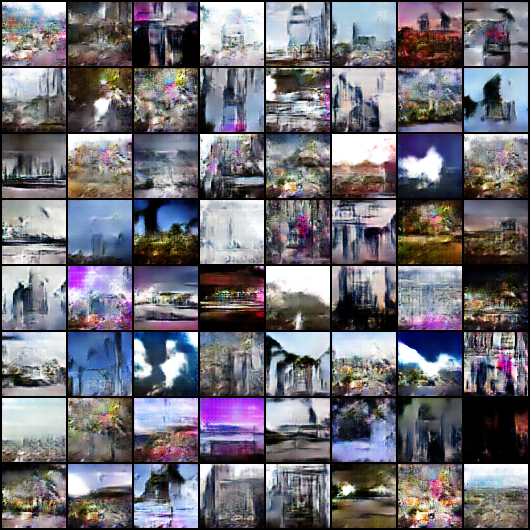

In [ ]:
Image('./generated/generated-images-0500.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

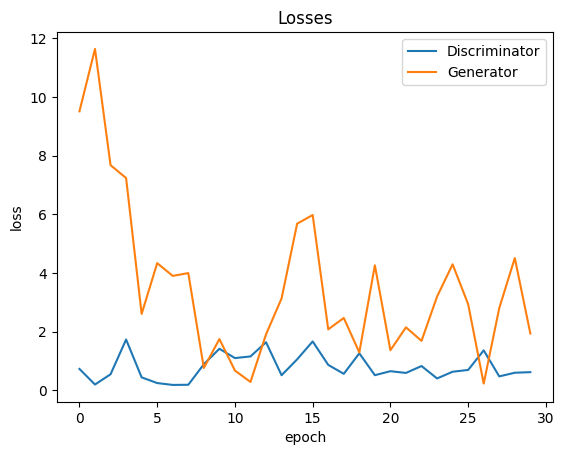

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

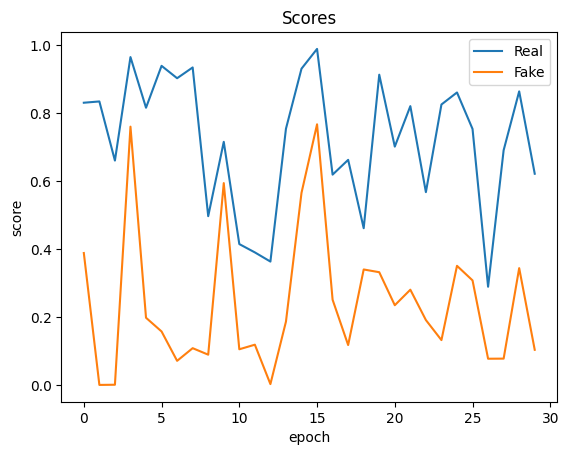

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

Confusion Matrix:
[[ 4 26]
 [ 6 24]]


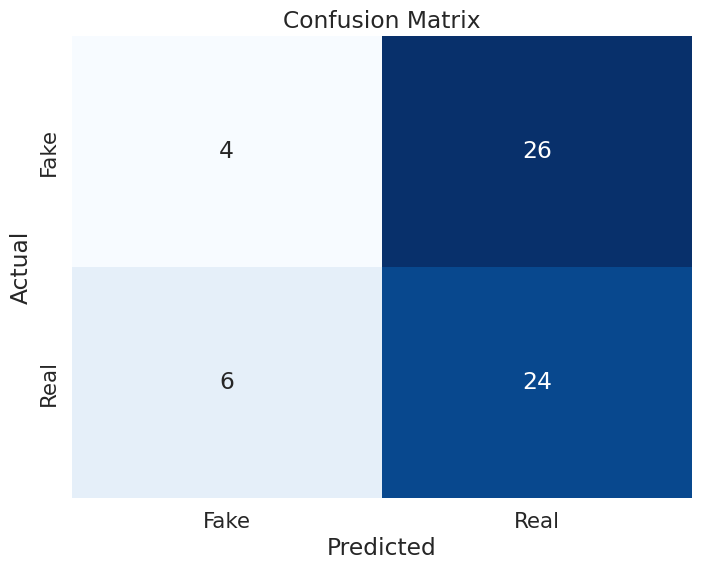

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Function to classify scores and generate confusion matrix
def calculate_confusion_matrix(real_scores, fake_scores):
    # Set threshold for classification
    threshold = 0.5

    # Classify scores as real or fake based on threshold
    real_predictions = [1 if score >= threshold else 0 for score in real_scores]
    fake_predictions = [1 if score < threshold else 0 for score in fake_scores]

    # Combine predictions
    all_predictions = real_predictions + fake_predictions

    # Create ground truth labels
    all_labels = [1] * len(real_scores) + [0] * len(fake_scores)

    # Calculate confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)

    return cm

# Call the function to calculate confusion matrix
conf_matrix = calculate_confusion_matrix(real_scores, fake_scores)
print("Confusion Matrix:")
print(conf_matrix)

def plot_confusion_matrix(cm):
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.4)  # Adjust font size
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False,
                xticklabels=['Fake', 'Real'], yticklabels=['Fake', 'Real'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Call the function to calculate and plot confusion matrix
plot_confusion_matrix(conf_matrix)
